### Read an image

(1104, 1376, 3)


C:\Users\nagor\AppData\Local\Temp\ipykernel_3456\783350208.py:20: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img3 = img.astype(np.float)


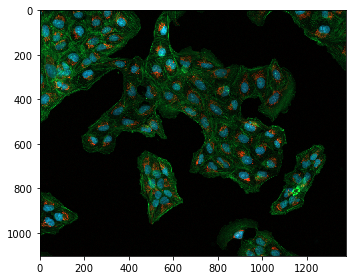

In [4]:
from skimage import io

img = io.imread("images/Osteosarcoma_01.tif")
print(img.shape)  #y,x,c

#x = Width = 1376
#y = Height = 1104
#Channels = 3 (RGB)

#Some image processing tasks in skimage require floating point image
#with values between 0 and 1

from skimage import img_as_float
img2 = img_as_float(img)

io.imshow(img)


import numpy as np
img3 = img.astype(np.float)
#avoid using astype as it violates assumptions about dtype range.
#for example float should range from 0 to 1 (or -1 to 1) but if you use 
#astype to convert to float, the values do not lie between 0 and 1. 

#Convert back to 8 bit
from skimage import img_as_ubyte
img_8bit = img_as_ubyte(img2)

## Reading properties of microscopic image

In [8]:
import tifffile
#RGB images
img = tifffile.imread("images/Osteosarcoma_01.tif")

print (img.shape)


(1104, 1376, 3)


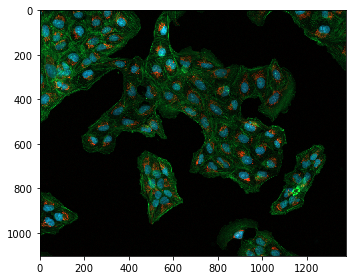

In [6]:
io.imshow(img)

### Saving a modified image to disk

In [12]:
#Read an image
from skimage import io
img = io.imread("images/Osteosarcoma_01.tif")

#Do something to the image
#e.g. let us apply gaussian smoothing
from skimage import filters
gaussian_img = filters.gaussian(img, sigma=1)

#Save image using skimage
#Best way as it converts float images to RGB and scales them accordingly
io.imsave("images/exported/saved_using_skimage.tif", gaussian_img)

#File autoamtically gets saved to right format based on the extension.
#We can define the exact library to be used to save files but defaults work ok.
#For tiff extensions it uses tifffile library to save images, in the background.
#First, image needs to be converted to 8 bit unsigned integer.  

from skimage import img_as_ubyte
gaussian_img_8bit = img_as_ubyte(gaussian_img)

io.imsave("images/exported/saved_using_skimage_u8bit.jpg", gaussian_img)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


### Ploting the images

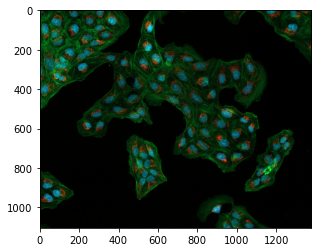

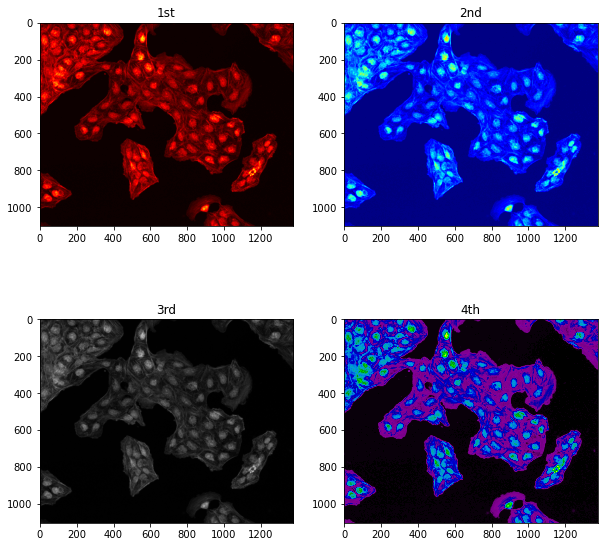

In [16]:
import matplotlib.pyplot as plt

#Colormaps...  https://matplotlib.org/tutorials/colors/colormaps.html
plt.imshow(img, cmap="hot")
#Not going to do anything as the input image is RGB

img_gray = io.imread("images/Osteosarcoma_01.tif", as_gray=True)



#Multiple plots using pyplot
fig = plt.figure(figsize=(10, 10))

ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img_gray, cmap='hot')
ax1.title.set_text('1st')

ax2 = fig.add_subplot(2,2,2)
ax2.imshow(img_gray, cmap='jet')
ax2.title.set_text('2nd')

ax3 = fig.add_subplot(2,2,3)
ax3.imshow(img_gray, cmap='gray')
ax3.title.set_text('3rd')

ax4 = fig.add_subplot(2,2,4)
ax4.imshow(img_gray, cmap='nipy_spectral')
ax4.title.set_text('4th')
plt.show()

### Unsharp an image

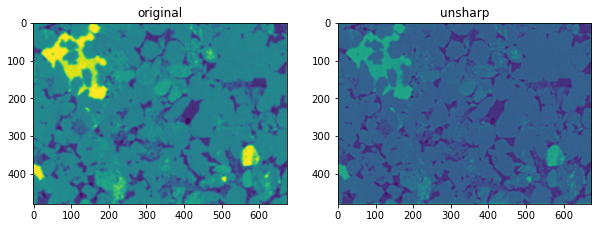

In [28]:
from skimage import io, img_as_float
from skimage.filters import unsharp_mask
from skimage.filters  import gaussian

img = img_as_float(io.imread("images/sandstone_blur_2sigma.tif", as_gray= True))

gaussain_img= gaussian(img,sigma=2,mode='constant',cval=0.0)

img2 = (img - gaussain_img)*2

img3 = img+img2


from matplotlib import pyplot as plt
fig = plt.figure(figsize=(10, 10))

ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img)
ax1.title.set_text('original')

ax2 = fig.add_subplot(2,2,2)
ax2.imshow(img3)
ax2.title.set_text('unsharp')


### Median Filter

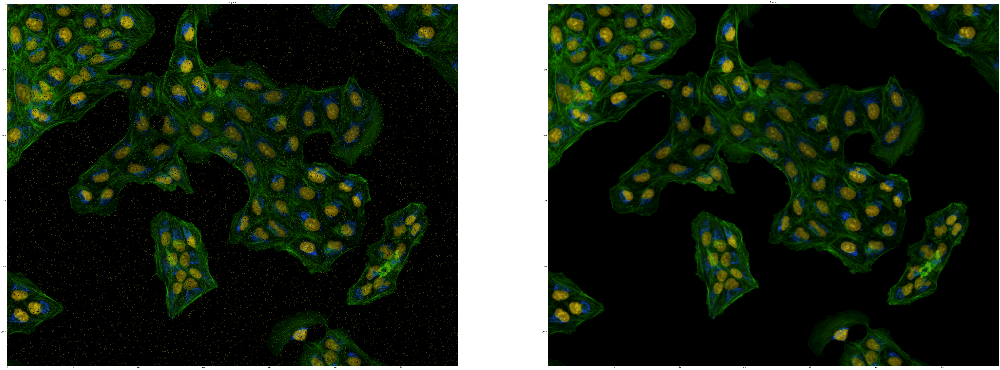

In [39]:
import cv2
img_slat_and_ppr_noise = cv2.imread("images/Osteosarcoma_01_8bit_salt_pepper.tif")

aply_median_filter_img = cv2.medianBlur(img_slat_and_ppr_noise,3)


from matplotlib import pyplot as plt
fig = plt.figure(figsize=(100, 100))

ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img_slat_and_ppr_noise)
ax1.title.set_text('original')

ax2 = fig.add_subplot(2,2,2)
ax2.imshow(aply_median_filter_img)
ax2.title.set_text('Filtered')





### No local means (NLM) denoising filter

In [40]:
import cv2
import numpy as np
from skimage import io, img_as_float
from skimage.restoration import denoise_nl_means, estimate_sigma

img_gaussian_noise = img_as_float(io.imread('images/Osteosarcoma_01_25Sigma_noise.tif', as_gray=True))
img_salt_pepper_noise = img_as_float(io.imread('images/Osteosarcoma_01_8bit_salt_pepper.tif', as_gray=True))

img = img_gaussian_noise

sigma_est = np.mean(estimate_sigma(img, multichannel=True))
#sigma_est = 0.1

denoise_img = denoise_nl_means(img, h=1.15 * sigma_est, fast_mode=True,
                               patch_size=5, patch_distance=3, multichannel=False)

"""
When the fast_mode argument is False, a spatial Gaussian weighting is applied 
to the patches when computing patch distances. When fast_mode is True a 
faster algorithm employing uniform spatial weighting on the patches is applied.

Larger h allows more smoothing between disimilar patches.

"""

#denoise_img_as_8byte = img_as_ubyte(denoise_img)



cv2.imshow("Original", img)
cv2.imshow("NLM Filtered", denoise_img)
cv2.waitKey(0)          
cv2.destroyAllWindows() 


C:\Users\nagor\AppData\Local\Temp\ipykernel_3456\764263648.py:11: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(img, multichannel=True))
C:\Users\nagor\AppData\Local\Temp\ipykernel_3456\764263648.py:14: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  denoise_img = denoise_nl_means(img, h=1.15 * sigma_est, fast_mode=True,
